In [1]:
import numpy.matlib;
import numpy as np;
import networkx as nx;
import matplotlib.pyplot as plt;
import random
import copy
import math
from copy import copy, deepcopy
from itertools import product

In [26]:
def Create_Network(n):
    G = nx.erdos_renyi_graph(n, 0.3, seed=5)
    degrees = [val for (node, val) in G.degree()]
    delta = max(degrees)
    A_0 = np.asarray(nx.to_numpy_matrix(G))
    A = A_0[:]
    
    # Create a 3D figure
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot the 3D graph
    pos = nx.spring_layout(G, dim=3)
    for edge in G.edges():
        u, v = edge
        ax.plot([pos[u][0], pos[v][0]], [pos[u][1], pos[v][1]], [pos[u][2], pos[v][2]], 'k-')
        
    # Plot the nodes
    for node in G.nodes():
        x, y, z= pos[node]
        ax.scatter(x, y, z, c='b', s=100, label='Node {}'.format(node))

    ax.set_axis_off()
        
    # ax.legend()
    
    # Save the 3D graph
    plt.savefig('network_3D.png', bbox_inches='tight')
    plt.show()

    return A, delta




In [2]:
def Create_Network (n):
    
    G = nx.erdos_renyi_graph(n, 0.3, seed = 5)#2
    degrees = [val for (node, val) in G.degree()]
    delta = max(degrees)
    A_0 = np.asarray(nx.to_numpy_matrix(G))
    A = A_0[:]
    #print(degrees);
    #print(delta);
    #print(A);
    #print(nx.to_numpy_matrix(G));
    nx.draw(G, with_labels=True)
    plt.savefig('network.png', bbox_inches='tight')
    plt.show()
    
    return A, delta

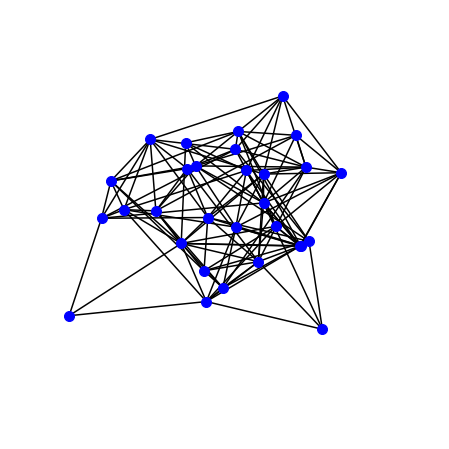

The location matrix is: 
 [[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1. 1. 1. 0. 0. 1. 0.
  1. 0. 1. 1. 0. 1.]
 [0. 0. 1. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 1. 0. 0.
  0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.
  1. 0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 1. 1. 0. 0. 0. 1.
  0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.
  0. 0. 1. 0. 1. 0.]
 [0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
  0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 1. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.
  0. 0. 1. 0. 0. 1.]
 [0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 1. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 1. 0. 1.
  0. 1. 0. 1. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
  0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0

In [27]:
network = Create_Network(30)
G = network[0]
delta = network[1]
print("The location matrix is: \n", G)
print("The degree of the graph is:\n", delta)

In [11]:
m = delta + 1
print("The cardinality of the color set is: \n", m)

The cardinality of the color set is: 
 14


In [12]:
def neighborhood(G):
    neighborhood = []
    for i in range(len(G)):
        neighbors = []
        for j in range(len(G)):
            if G[i][j] == 1:
                neighbors.append(j)
        neighborhood.append(list(neighbors))
    return neighborhood

In [13]:
neighborhood_G = neighborhood(G)
print(neighborhood_G)

[[7, 12, 14, 17, 18, 19, 22, 24, 26, 27, 29], [2, 5, 9, 14, 16, 17, 18, 21], [1, 3, 5, 8, 12, 13, 14, 16, 24, 28], [2, 4, 13, 14, 15, 18, 19, 23, 28], [3, 5, 8, 13, 15, 17, 26, 28], [1, 2, 4, 11, 12, 23, 27], [8, 10, 28], [0, 13, 22, 23, 26, 29], [2, 4, 6, 10, 11, 12, 14, 15, 16, 21, 23, 25, 27], [1, 10, 12, 22], [6, 8, 9, 11, 12, 15, 20, 21, 27], [5, 8, 10, 16, 18, 21, 24, 26, 29], [0, 2, 5, 8, 9, 10, 13, 14, 16, 22, 27], [2, 3, 4, 7, 12, 17, 18, 23], [0, 1, 2, 3, 8, 12, 19, 20, 22, 26, 29], [3, 4, 8, 10, 20, 23, 24, 28], [1, 2, 8, 11, 12, 20, 22, 26, 27, 29], [0, 1, 4, 13, 20, 22, 23, 25, 26], [0, 1, 3, 11, 13, 19, 26, 28], [0, 3, 14, 18, 24, 26, 29], [10, 14, 15, 16, 17, 21, 24, 27, 29], [1, 8, 10, 11, 20, 22, 24, 29], [0, 7, 9, 12, 14, 16, 17, 21, 24, 25, 28, 29], [3, 5, 7, 8, 13, 15, 17, 27], [0, 2, 11, 15, 19, 20, 21, 22, 25], [8, 17, 22, 24, 26], [0, 4, 7, 11, 14, 16, 17, 18, 19, 25], [0, 5, 8, 10, 12, 16, 20, 23], [2, 3, 4, 6, 15, 18, 22], [0, 7, 11, 14, 16, 19, 20, 21, 22]]


In [14]:
class coloring:
    def __init__(self, graph, degree, m):
        self.graph = graph
        self.degree = degree
        self.color = m # m denotes the cardinality of the color set

    def initial_proper_coloring(self):
        G = self.graph
        options = []
        for k in range(len(G)):
            options.append(list(range(self.color)))
        color_assignment = [0] * len(G)
        #print(color_set);
        #print(len(options[50]));
        #print(color_assignment);
        random.seed(9)
        i = 0
        while i < len(G):
            #print("i = ", i);
            for j in range(i + 1):
                if (G[i][j] == 1) and (color_assignment[j] in options[i]):
                    
                    options[i].remove(color_assignment[j])
                    #print("conflict vertex = ",j);
                else:
                    pass
            #print("options of ", i,"are ", options[i]);
            color_assignment[i] = random.choice(options[i])
            #print("color assignment: ", color_assignment);
            i += 1
        available_color_list = []
        for l in range(len(G)):
            available_color_list.append(list(range(self.color)))
        #print(available_color_list)

        #original_color = list(range(self.color)) # initialize as all provided colors
        #print(len(available_color_list))
        for k in range(len(G)):
            available_color_list[k].remove(color_assignment[k])
            for i in range(len(G)):
                if G[k][i] == 1 and color_assignment[i] in available_color_list[k]: # identify whether it is neighbor
                    available_color_list[k].remove(color_assignment[i]) # remove the color from the available set
                #print(available_color_list[k])
        return color_assignment, available_color_list # len(G)*1 vector



In [15]:
def isProper(A, L):
    isProper = 1
    for i in range(len(A)):
        for j in range(i):
            if A[i][j] == 1:
                if L[i] == L[j]:
                    isProper = 0
                    print("clashing vertices: ", i, "and ", j)
                    break
                else:
                    pass
            else:
                pass
    return isProper

In [137]:
C = coloring(G, delta, m)
print(C)
initial_pc = C.initial_proper_coloring()
initial_color_assignment = initial_pc[0]
initial_avaicolorlist = initial_pc[1]
print("The initial proper coloring is: \n", initial_color_assignment)
print("The avaicolorlist associated with the initial proper coloring is: \n", initial_avaicolorlist)

The initial proper coloring is: 
 [14, 19, 11, 8, 4, 5, 21, 0, 12, 18, 15, 22, 3, 10, 22, 2, 17, 7, 19, 16, 10, 7, 5, 2, 5, 3, 22, 4, 18, 3, 12, 3, 8, 21, 18, 6, 20, 8, 5, 13, 10, 9, 1, 7, 0, 11, 1, 15, 20, 7]
The avaicolorlist associated with the initial proper coloring is: 
 [[2, 6, 9, 10, 13, 15, 17, 18, 20], [0, 4, 5, 9, 11, 12, 13, 14, 17, 18, 21, 22], [0, 2, 3, 6, 7, 9, 10, 12, 14, 19, 20, 21], [0, 1, 2, 4, 6, 7, 9, 11, 12, 13, 14, 16, 18, 19, 20, 21, 22], [0, 9, 12, 13, 14, 15, 16, 17, 18, 20], [1, 2, 4, 6, 14, 16, 18, 19, 20, 21], [0, 1, 2, 4, 6, 7, 8, 9, 11, 13, 14, 17, 19], [4, 7, 8, 9, 16, 17, 19, 22], [4, 8, 10, 11, 13, 14, 16, 17, 19, 20, 21], [2, 4, 6, 8, 13, 14, 15, 16, 17], [4, 6, 8, 10, 13, 14, 16], [0, 3, 6, 12, 14, 15, 16, 19], [10, 11, 12, 13, 16, 17, 21, 22], [0, 3, 4, 6, 7, 12, 14, 16], [0, 2, 5, 6, 9, 13, 15, 16, 17, 19, 21], [1, 6, 11, 12, 13, 14, 17, 18, 22], [0, 1, 2, 3, 4, 6, 7, 12, 14, 18, 19, 21], [0, 2, 6, 8, 9, 10, 11, 13, 16, 17, 21], [1, 2, 6, 8, 12, 15

In [138]:
isProper(G, initial_color_assignment)

1

In [139]:
def utility_generator(G):
    np.random.seed(10)
    utility_matrix = 10 * np.random.random((len(G), len(G)))
    return utility_matrix

In [140]:
utility_matrix = utility_generator(G)
print(utility_matrix)

[[0.77132064 0.02075195 0.63364823 ... 0.88393648 0.32551164 0.1650159 ]
 [0.39252924 0.09346037 0.82110566 ... 0.44077382 0.31827281 0.51979699]
 [0.57813643 0.85393375 0.06809727 ... 0.42845074 0.69389007 0.10461974]
 ...
 [0.31952766 0.57724809 0.47806585 ... 0.40886837 0.66793604 0.57507234]
 [0.43012642 0.4327041  0.8673965  ... 0.64046283 0.74715563 0.88723216]
 [0.21061186 0.59270437 0.19598517 ... 0.63058644 0.60283126 0.05998132]]


In [141]:
type(utility_matrix)

numpy.ndarray

In [142]:
def MHA(G, neighborhood_G, initial_color_assignment, initial_avaicolorlist, T, utility_matrix, temp0):
    welfare = [0]*(T + 1)
    for i in range(len(G)):
        welfare[0] += utility_matrix[i][initial_color_assignment[i]]
    print(welfare[0])
    avaicolorlist = deepcopy(initial_avaicolorlist)
    color_assignment = deepcopy(initial_color_assignment)
    for j in range(T):
        V = random.choice(range(len(G)))
        print("V = ", V)
        old = color_assignment[V]
        print("old color is ", old)
        print("old utility = ", utility_matrix[V][old])
        print("Is old in avaicolorlist? ", old in avaicolorlist[V])
        print("The avaicolorlist for ", V, "is ", avaicolorlist[V])
        new = random.choice(avaicolorlist[V])
        print("new color is ", new)
        print("new utility = ", utility_matrix[V][new])
        temp = temp0 * np.power(0.9, j)
        trans_prob = min(1, np.exp((utility_matrix[V][new] - utility_matrix[V][old])/temp))
        print("The transition probability is ", trans_prob)
        u = random.uniform(0, 1)
        if u < trans_prob:
            print("MOVE!")
            color_assignment[V] = new
            print("Is the new assignment proper? ", isProper(G, color_assignment))
            avaicolorlist[V].remove(new)
            avaicolorlist[V].append(old)
            for U in neighborhood_G[V]: #update the avaicolorlist of nighbors
                if new in avaicolorlist[U]:
                    avaicolorlist[U].remove(new)
                neighbor_color = []
                for W in neighborhood_G[U]:
                    neighbor_color.append(color_assignment[W])
                if old not in neighbor_color:
                    avaicolorlist[U].append(old)
            welfare_margin = utility_matrix[V][new] - utility_matrix[V][old]
            print("welfare margin is ", welfare_margin)
            welfare[j + 1] = welfare[j] + welfare_margin
        else:
            print("STAY!")
            welfare[j + 1] = welfare[j]
    return welfare, color_assignment


In [143]:
random.seed(30)
MHA_result = MHA(G, neighborhood_G, initial_color_assignment, initial_avaicolorlist, int(2000), utility_matrix, 100)
welfare = MHA_result[0]
optimal_assignment = MHA_result[1]


23.44786673114055
V =  34
old color is  18
old utility =  0.14674543088775016
Is old in avaicolorlist?  False
The avaicolorlist for  34 is  [0, 1, 2, 5, 9, 10, 11, 14, 17, 19, 20, 22]
new color is  9
new utility =  0.055569813316688976
The transition probability is  0.9990886593476564
MOVE!
Is the new assignment proper?  1
welfare margin is  -0.09117561757106118
V =  39
old color is  13
old utility =  0.8305064675822286
Is old in avaicolorlist?  False
The avaicolorlist for  39 is  [1, 4, 6, 12, 14, 15, 16, 18]
new color is  12
new utility =  0.18559294073078592
The transition probability is  0.9928599066026634
MOVE!
Is the new assignment proper?  1
welfare margin is  -0.6449135268514427
V =  3
old color is  8
old utility =  0.1981006572162689
Is old in avaicolorlist?  False
The avaicolorlist for  3 is  [0, 1, 2, 4, 6, 7, 9, 11, 12, 13, 14, 16, 18, 19, 20, 21, 22]
new color is  18
new utility =  0.8382613207036929
The transition probability is  1
MOVE!
Is the new assignment proper?  1
w

/var/folders/ty/glwljgt93kv4cddc7b1kk26c0000gn/T/ipykernel_18629/568787705.py:20: RuntimeWarning: overflow encountered in exp
  trans_prob = min(1, np.exp((utility_matrix[V][new] - utility_matrix[V][old])/temp))


 0.8382613207036929
Is old in avaicolorlist?  False
The avaicolorlist for  3 is  [1, 4, 6, 7, 12, 8, 17, 21, 5, 3, 15, 9, 22, 20, 19, 10]
new color is  5
new utility =  0.8000687506941452
The transition probability is  0.0
STAY!
V =  26
old color is  22
old utility =  0.37053512307586267
Is old in avaicolorlist?  False
The avaicolorlist for  26 is  [1, 3, 10, 21, 13, 8, 9, 4, 7, 15, 0, 6, 20]
new color is  4
new utility =  0.6695737944604466
The transition probability is  1
MOVE!
Is the new assignment proper?  1
welfare margin is  0.29903867138458395
V =  22
old color is  11
old utility =  0.8957449001494221
Is old in avaicolorlist?  False
The avaicolorlist for  22 is  [1, 21, 9, 15, 10, 3, 20, 22]
new color is  1
new utility =  0.1715304941926603
The transition probability is  0.0
STAY!
V =  17
old color is  7
old utility =  0.8310449656508918
Is old in avaicolorlist?  False
The avaicolorlist for  17 is  [0, 15, 4, 8, 3, 5, 2, 20, 22, 18, 10]
new color is  0
new utility =  0.241745862

In [83]:
print(initial_color_assignment)

[7, 9, 5, 4, 2, 2, 11, 0, 7, 9, 8, 7, 0, 7, 1, 9, 3, 10, 5, 7]


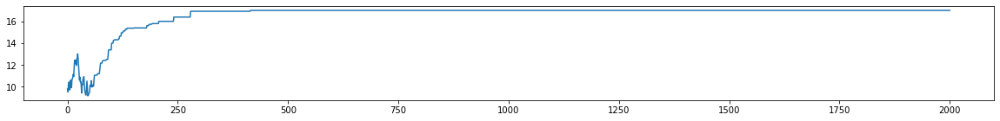

In [84]:
fig = plt.figure(figsize=(20, 2))

ax = fig.add_subplot(111)

ax.plot(range(len(welfare[:])), welfare[:])

#plt.plot(range(len(welfare)), welfare)


In [144]:
isProper(G, optimal_assignment)

1

In [145]:
print("maximum welfare: ", max(welfare))
print("the optimal coloring: ", optimal_assignment)

maximum welfare:  46.957089170684185
the optimal coloring:  [18, 6, 18, 18, 12, 13, 14, 8, 10, 17, 13, 11, 1, 15, 3, 4, 5, 22, 19, 7, 10, 16, 11, 17, 2, 0, 5, 1, 11, 5, 6, 5, 14, 19, 13, 15, 8, 0, 21, 10, 1, 6, 6, 19, 22, 4, 16, 12, 19, 9]


In [146]:
def all_proper(G, m):
    all_proper = []
    color_list = list(range(m))
    all_colorings = list(product(color_list, repeat=len(G)))
    for i in all_colorings:
        if isProper(G, i) == 1:
            all_proper.append(i)
    return all_proper


In [157]:
def MHA_maxmin(G, neighborhood_G, initial_color_assignment, initial_avaicolorlist, T, utility_matrix, temp0, temp1):
    welfare = [0]*T
    avaicolorlist = deepcopy(initial_avaicolorlist)
    color_assignment = deepcopy(initial_color_assignment)
    move = 1 #initialize

    for j in range(T):
        if move == 1:
            utility_curr = []
            for i in range(len(G)):
                utility_curr.append(utility_matrix[i][color_assignment[i]])
            welfare[j] = min(utility_curr) 

            welfare[j] = min(utility_curr) + sum(utility_curr)

        else:
            welfare[j] = welfare[j - 1]

        V = random.choice(range(len(G)))
        print("V = ", V)
        old = color_assignment[V]
        print("old color is ", old)
        print("old utility = ", utility_matrix[V][old])
        print("Is old in avaicolorlist? ", old in avaicolorlist[V])
        print("The avaicolorlist for ", V, "is ", avaicolorlist[V])
        new = random.choice(avaicolorlist[V])
        print("new color is ", new)
        print("new utility = ", utility_matrix[V][new])
        #temp_0 = temp0 * np.power(0.9, j)
        temp_1 = temp1 * np.power(0.9, j)
        #trans_prob_0 = min(1, np.exp((utility_matrix[V][new] - utility_matrix[V][old])/temp_0))
        #print("The transition probability is ", trans_prob_init)
        
        local_utility = []
        for neighbor in neighborhood_G[V]:
            local_utility.append(utility_matrix[neighbor][color_assignment[neighbor]])
        local_smallest =  min(local_utility)
        
        if utility_matrix[V][old] > local_smallest: #V is not the smallest among the neighborhood
            #trans_prob_1 = min(1, np.exp((utility_matrix[V][new] - local_smallest)/temp_1))
            trans_prob_1 = min(1, np.exp((utility_matrix[V][new] - local_smallest + utility_matrix[V][new] - utility_matrix[V][old])/temp_1))
        else: # V is the smallest in the neighborhood
            if utility_matrix[V][old] <= utility_matrix[V][new]:
                trans_prob_1 = 1
            else:
                #trans_prob_1 = min(1, np.exp((utility_matrix[V][new] - utility_matrix[V][old])/temp_1))
                trans_prob_1 = min(1, np.exp(2 * (utility_matrix[V][new] - utility_matrix[V][old])/temp_1))
        #trans_prob = trans_prob_0 * trans_prob_1
        trans_prob = trans_prob_1 

        u = random.uniform(0, 1)
        if u < trans_prob:
            print("MOVE!")
            color_assignment[V] = new
            print("Is the new assignment proper? ", isProper(G, color_assignment))
            avaicolorlist[V].remove(new)
            avaicolorlist[V].append(old)
            for U in neighborhood_G[V]: #update the avaicolorlist of nighbors
                if new in avaicolorlist[U]:
                    avaicolorlist[U].remove(new)
                neighbor_color = []
                for W in neighborhood_G[U]:
                    neighbor_color.append(color_assignment[W])
                if old not in neighbor_color:
                    avaicolorlist[U].append(old)
            move = 1
        else:
            print("STAY!")
            move = 0
    
    return welfare, color_assignment
    
    

V =  35
old color is  6
old utility =  0.013257447476215045
Is old in avaicolorlist?  False
The avaicolorlist for  35 is  [9, 10, 11, 13, 14, 15, 17, 20, 21]
new color is  15
new utility =  0.8798167624771163
MOVE!
Is the new assignment proper?  1
V =  47
old color is  15
old utility =  0.46619905480819757
Is old in avaicolorlist?  False
The avaicolorlist for  47 is  [1, 6, 9, 12, 13, 14, 16, 17, 22]
new color is  14
new utility =  0.27299922113324304
MOVE!
Is the new assignment proper?  1
V =  18
old color is  19
old utility =  0.9578372219957907
Is old in avaicolorlist?  False
The avaicolorlist for  18 is  [1, 2, 6, 8, 12, 15, 17, 21]
new color is  17
new utility =  0.18159118615953085
MOVE!
Is the new assignment proper?  1
V =  36
old color is  20
old utility =  0.40717927241375096
Is old in avaicolorlist?  False
The avaicolorlist for  36 is  [1, 4, 5, 6, 9, 11, 12, 22, 19]
new color is  1
new utility =  0.9633087827572147
MOVE!
Is the new assignment proper?  1
V =  48
old color is 

/var/folders/ty/glwljgt93kv4cddc7b1kk26c0000gn/T/ipykernel_18629/1542315304.py:41: RuntimeWarning: overflow encountered in exp
  trans_prob_1 = min(1, np.exp((utility_matrix[V][new] - local_smallest + utility_matrix[V][new] - utility_matrix[V][old])/temp_1))


 6
new utility =  0.9426874804292175
MOVE!
Is the new assignment proper?  1
V =  38
old color is  4
old utility =  0.6973326180719766
Is old in avaicolorlist?  False
The avaicolorlist for  38 is  [9, 21, 12, 3, 17, 6, 16, 11, 18]
new color is  11
new utility =  0.4627697526924629
STAY!
V =  17
old color is  19
old utility =  0.9464418322439493
Is old in avaicolorlist?  False
The avaicolorlist for  17 is  [8, 5, 4, 17, 6, 12, 0, 20, 3]
new color is  6
new utility =  0.468881293183638
STAY!
V =  23
old color is  17
old utility =  0.9837021425298528
Is old in avaicolorlist?  False
The avaicolorlist for  23 is  [4, 9, 11, 12, 0, 19, 3, 10, 21, 7, 2]
new color is  21
new utility =  0.08657260852568338
STAY!
V =  5
old color is  21
old utility =  0.5989364490726748
Is old in avaicolorlist?  False
The avaicolorlist for  5 is  [16, 20, 8, 7, 11, 12, 5, 2, 4, 14, 0]
new color is  7
new utility =  0.60105189113251
MOVE!
Is the new assignment proper?  1
V =  18
old color is  16
old utility =  0.6

/var/folders/ty/glwljgt93kv4cddc7b1kk26c0000gn/T/ipykernel_18629/1542315304.py:41: RuntimeWarning: overflow encountered in double_scalars
  trans_prob_1 = min(1, np.exp((utility_matrix[V][new] - local_smallest + utility_matrix[V][new] - utility_matrix[V][old])/temp_1))
/var/folders/ty/glwljgt93kv4cddc7b1kk26c0000gn/T/ipykernel_18629/1542315304.py:47: RuntimeWarning: overflow encountered in double_scalars
  trans_prob_1 = min(1, np.exp(2 * (utility_matrix[V][new] - utility_matrix[V][old])/temp_1))


 is  [13, 10, 11, 7, 20, 15, 3, 17, 12]
new color is  15
new utility =  0.5550492206975839
STAY!
V =  25
old color is  0
old utility =  0.9319261918698378
Is old in avaicolorlist?  False
The avaicolorlist for  25 is  [2, 14, 18, 9, 5, 15, 20, 8, 3, 1]
new color is  8
new utility =  0.18316402775811647
STAY!
V =  3
old color is  21
old utility =  0.8485091818947146
Is old in avaicolorlist?  False
The avaicolorlist for  3 is  [9, 0, 17, 14, 2, 19, 4, 22, 13, 15, 8, 3, 18, 6, 5, 20]
new color is  2
new utility =  0.5069786292640474
STAY!
V =  29
old color is  5
old utility =  0.9679474559715064
Is old in avaicolorlist?  False
The avaicolorlist for  29 is  [14, 11, 13, 2, 6, 15, 22, 3, 0, 17, 1]
new color is  14
new utility =  0.6202657886890243
STAY!
V =  30
old color is  6
old utility =  0.9541227305606255
Is old in avaicolorlist?  False
The avaicolorlist for  30 is  [15, 10, 9, 8, 20, 22, 16, 3, 7, 1]
new color is  1
new utility =  0.7692522950992429
STAY!
V =  23
old color is  3
old ut

/var/folders/ty/glwljgt93kv4cddc7b1kk26c0000gn/T/ipykernel_18629/1542315304.py:41: RuntimeWarning: divide by zero encountered in double_scalars
  trans_prob_1 = min(1, np.exp((utility_matrix[V][new] - local_smallest + utility_matrix[V][new] - utility_matrix[V][old])/temp_1))
/var/folders/ty/glwljgt93kv4cddc7b1kk26c0000gn/T/ipykernel_18629/1542315304.py:47: RuntimeWarning: divide by zero encountered in double_scalars
  trans_prob_1 = min(1, np.exp(2 * (utility_matrix[V][new] - utility_matrix[V][old])/temp_1))


is  [21, 8, 13, 9, 2, 11, 22, 14, 4, 17, 0, 16]
new color is  4
new utility =  0.5468971846408381
STAY!
V =  28
old color is  11
old utility =  0.9906692306763057
Is old in avaicolorlist?  False
The avaicolorlist for  28 is  [20, 10, 13, 19, 14, 2, 17, 1, 0, 16]
new color is  20
new utility =  0.06395392493747731
STAY!
V =  34
old color is  15
old utility =  0.9689881107806262
Is old in avaicolorlist?  False
The avaicolorlist for  34 is  [9, 2, 21, 3, 18, 8, 6, 20, 14, 11, 5, 0]
new color is  18
new utility =  0.14674543088775016
STAY!
V =  9
old color is  17
old utility =  0.970239530226589
Is old in avaicolorlist?  False
The avaicolorlist for  9 is  [8, 20, 22, 21, 4, 2, 5, 16, 0, 3]
new color is  8
new utility =  0.8078665332650923
STAY!
V =  42
old color is  6
old utility =  0.9489459948992098
Is old in avaicolorlist?  False
The avaicolorlist for  42 is  [14, 20, 12, 7, 5, 0, 16]
new color is  16
new utility =  0.9297040680215122
MOVE!
Is the new assignment proper?  1
V =  28
old c

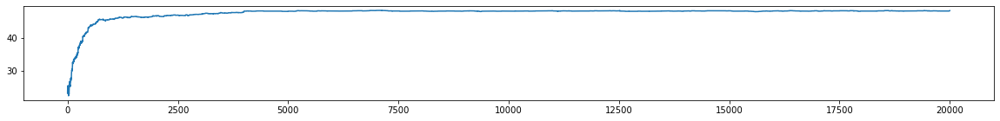

In [166]:
random.seed(35)
MHA_result_maxmin = MHA_maxmin(G, neighborhood_G, initial_color_assignment, initial_avaicolorlist, int(20000), utility_matrix, 100, 100)
welfare_maxmin = MHA_result_maxmin[0]
optimal_assignment_maxmin = MHA_result_maxmin[1]

fig = plt.figure(figsize=(20, 2))

ax = fig.add_subplot(111)

ax.plot(range(len(welfare_maxmin[:])), welfare_maxmin[:])

print("the final welfare is: ", welfare_maxmin[-1])
print("the optimal assignment is: ", optimal_assignment_maxmin)


In [162]:
def MHA_maxmin_centralized(G, neighborhood_G, initial_color_assignment, initial_avaicolorlist, T, utility_matrix, temp0, temp1):
    welfare = [0]*T
    avaicolorlist = deepcopy(initial_avaicolorlist)
    color_assignment = deepcopy(initial_color_assignment)
    move = 1 #initialize

    for j in range(T):
        if move == 1:
            utility_curr = []
            for i in range(len(G)):
                utility_curr.append(utility_matrix[i][color_assignment[i]])
            welfare[j] = min(utility_curr)

            welfare[j] = min(utility_curr) + sum(utility_curr)
        else:
            welfare[j] = welfare[j - 1]

        print("welfare = ", welfare[j])

        V = random.choice(range(len(G)))
        print("V = ", V)
        old = color_assignment[V]
        print("old color is ", old)
        print("old utility = ", utility_matrix[V][old])
        print("Is old in avaicolorlist? ", old in avaicolorlist[V])
        print("The avaicolorlist for ", V, "is ", avaicolorlist[V])
        new = random.choice(avaicolorlist[V])
        print("new color is ", new)
        print("new utility = ", utility_matrix[V][new])
        #temp_0 = temp0 * np.power(0.9, j)
        temp_1 = temp1 * np.power(0.9, j)
        #trans_prob_0 = min(1, np.exp((utility_matrix[V][new] - utility_matrix[V][old])/temp_0))
        #print("The transition probability is ", trans_prob_init)
        
        if utility_matrix[V][old] > welfare[j]: #V is not the smallest among the neighborhood
            #trans_prob_1 = min(1, np.exp((utility_matrix[V][new] - welfare[j])/temp_1))

            if utility_matrix[V][new] >= utility_matrix[V][old]:
                trans_prob_1 = 1
            else:
                if utility_matrix[V][new] > welfare[j]:
                    trans_prob_1 = min(1, np.exp((utility_matrix[V][new] - utility_matrix[V][old])/temp_1))
                else:
                    trans_prob_1 = min(1, np.exp((utility_matrix[V][new] - welfare[j] + utility_matrix[V][new] - utility_matrix[V][old])/temp_1))
            #trans_prob_1 = min(1, np.exp((utility_matrix[V][new] - utility_matrix[V][old])/temp_1))
        else: # V is the smallest in the neighborhood
            if utility_matrix[V][old] <= utility_matrix[V][new]:
                trans_prob_1 = 1
            else:
                #trans_prob_1 = min(1, np.exp((utility_matrix[V][new] - utility_matrix[V][old])/temp_1))
                trans_prob_1 = min(1, np.exp(2 * (utility_matrix[V][new] - utility_matrix[V][old])/temp_1))
        
        #trans_prob = trans_prob_0 * trans_prob_1
        trans_prob = trans_prob_1

        u = random.uniform(0, 1)
        if u < trans_prob:
            print("MOVE!")
            color_assignment[V] = new
            print("Is the new assignment proper? ", isProper(G, color_assignment))
            avaicolorlist[V].remove(new)
            avaicolorlist[V].append(old)
            for U in neighborhood_G[V]: #update the avaicolorlist of nighbors
                if new in avaicolorlist[U]:
                    avaicolorlist[U].remove(new)
                neighbor_color = []
                for W in neighborhood_G[U]:
                    neighbor_color.append(color_assignment[W])
                if old not in neighbor_color:
                    avaicolorlist[U].append(old)
            move = 1
        else:
            print("STAY!")
            move = 0
    
    return welfare, color_assignment
    
    

welfare =  23.461124178616764
V =  34
old color is  18
old utility =  0.14674543088775016
Is old in avaicolorlist?  False
The avaicolorlist for  34 is  [0, 1, 2, 5, 9, 10, 11, 14, 17, 19, 20, 22]
new color is  9
new utility =  0.055569813316688976
MOVE!
Is the new assignment proper?  1
welfare =  23.369948561045703
V =  39
old color is  13
old utility =  0.8305064675822286
Is old in avaicolorlist?  False
The avaicolorlist for  39 is  [1, 4, 6, 12, 14, 15, 16, 18]
new color is  12
new utility =  0.18559294073078592
MOVE!
Is the new assignment proper?  1
welfare =  22.725035034194256
V =  3
old color is  8
old utility =  0.1981006572162689
Is old in avaicolorlist?  False
The avaicolorlist for  3 is  [0, 1, 2, 4, 6, 7, 9, 11, 12, 13, 14, 16, 18, 19, 20, 21, 22]
new color is  18
new utility =  0.8382613207036929
MOVE!
Is the new assignment proper?  1
welfare =  23.365195697681685
V =  8
old color is  12
old utility =  0.13560977226706927
Is old in avaicolorlist?  False
The avaicolorlist fo

/var/folders/ty/glwljgt93kv4cddc7b1kk26c0000gn/T/ipykernel_18629/932539720.py:51: RuntimeWarning: overflow encountered in double_scalars
  trans_prob_1 = min(1, np.exp(2 * (utility_matrix[V][new] - utility_matrix[V][old])/temp_1))


18
old color is  19
old utility =  0.9578372219957907
Is old in avaicolorlist?  False
The avaicolorlist for  18 is  [15, 20, 2, 0, 9, 18, 13, 3, 4, 1]
new color is  18
new utility =  0.8526460585286665
STAY!
welfare =  47.98733661016773
V =  11
old color is  15
old utility =  0.9421499192747
Is old in avaicolorlist?  False
The avaicolorlist for  11 is  [12, 8, 7, 11, 19, 13]
new color is  19
new utility =  0.09592006679437992
STAY!
welfare =  47.98733661016773
V =  18
old color is  19
old utility =  0.9578372219957907
Is old in avaicolorlist?  False
The avaicolorlist for  18 is  [15, 20, 2, 0, 9, 18, 13, 3, 4, 1]
new color is  0
new utility =  0.2975398248045932
STAY!
welfare =  47.98733661016773
V =  49
old color is  9
old utility =  0.9753819011692724
Is old in avaicolorlist?  False
The avaicolorlist for  49 is  [10, 21, 15, 3, 16, 4, 11, 12, 18, 17, 20]
new color is  21
new utility =  0.2119503103421092
STAY!
welfare =  47.98733661016773
V =  39
old color is  5
old utility =  0.9405

/var/folders/ty/glwljgt93kv4cddc7b1kk26c0000gn/T/ipykernel_18629/932539720.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  trans_prob_1 = min(1, np.exp(2 * (utility_matrix[V][new] - utility_matrix[V][old])/temp_1))


0.29187606817063316
STAY!
welfare =  47.98733661016773
V =  38
old color is  21
old utility =  0.889643380848384
Is old in avaicolorlist?  False
The avaicolorlist for  38 is  [14, 8, 4, 20, 3, 6, 17, 1, 2]
new color is  2
new utility =  0.1865271289078707
STAY!
welfare =  47.98733661016773
V =  18
old color is  19
old utility =  0.9578372219957907
Is old in avaicolorlist?  False
The avaicolorlist for  18 is  [15, 20, 2, 0, 9, 18, 13, 3, 4, 1]
new color is  2
new utility =  0.3928910553212097
STAY!
welfare =  47.98733661016773
V =  21
old color is  16
old utility =  0.9925319133165988
Is old in avaicolorlist?  False
The avaicolorlist for  21 is  [11, 8, 14, 18, 1, 20, 0, 2, 7]
new color is  8
new utility =  0.4149531641983125
STAY!
welfare =  47.98733661016773
V =  24
old color is  2
old utility =  0.9678727674569982
Is old in avaicolorlist?  False
The avaicolorlist for  24 is  [10, 22, 16, 20, 7, 11, 19, 3, 17, 12]
new color is  16
new utility =  0.9007817202363154
STAY!
welfare =  47.

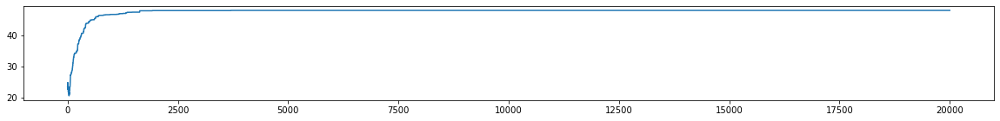

In [165]:
random.seed(30)
MHA_result_maxmin_centralized = MHA_maxmin_centralized(G, neighborhood_G, initial_color_assignment, initial_avaicolorlist, int(20000), utility_matrix, 1000, 100)
welfare_maxmin_centralized = MHA_result_maxmin_centralized[0]
optimal_assignment_maxmin_centralized = MHA_result_maxmin_centralized[1]

fig = plt.figure(figsize=(20, 2))

ax = fig.add_subplot(111)

ax.plot(range(len(welfare_maxmin_centralized[:])), welfare_maxmin_centralized[:])

print("the final welfare is: ", welfare_maxmin_centralized[-1])
print("the final assignment is: ", optimal_assignment_maxmin_centralized)
